In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import sys
sys.path.append('./gdrive/MyDrive/am220')

In [3]:
import numpy as np
from matplotlib import pyplot as plt
from loader import *
from sklearn.model_selection import train_test_split
import tf_util
from matplotlib import pyplot as plt

In [1]:
import os
from PIL import Image
import torch
from torchvision.transforms import ToTensor
import torchvision.transforms as T
import tensorflow as tf
from tensorflow.keras.layers import UpSampling2D, concatenate, Conv2D

In [5]:
def Read_Image(name, rootpath, diction, resize_size=(768, 512)):
  img = Image.open(rootpath+"/{}".format(name))
  img_label = Image.open(rootpath+"/{}".format(diction[name]))
  img = img.resize(resize_size)
  img_label = img_label.resize(resize_size)
  img_tensor = ToTensor()(img)
  label_tensor = (ToTensor()(img_label)>0)*1
  return np.transpose(img_tensor, (1, 2, 0)), label_tensor.reshape(resize_size[1], -1, 1)

In [6]:
images_list = get_image_list('./gdrive/MyDrive/am220/data')
labels_image = sorted(images_list[['anno' in x for x in images_list]])
pixels_image = sorted(images_list[['anno' not in x and '.bmp' in x for x in images_list]])
##construct a map that maps image file name to label file name
image_label_dict = {name: name.split('.')[0] + '_anno.bmp' for name in pixels_image}

In [7]:
rootpath = './gdrive/MyDrive/am220/data'
X = []; Y = []
i=1
for name in pixels_image:
    if i%10 == 0:
        print("Processing {}th Image.".format(i))
    i+=1
    x, y = Read_Image(name, rootpath, image_label_dict)
    X.append(x.numpy())
    Y.append(y.numpy())
X = np.array(X); Y = np.array(Y)

Processing 10th Image.
Processing 20th Image.
Processing 30th Image.
Processing 40th Image.
Processing 50th Image.
Processing 60th Image.
Processing 70th Image.
Processing 80th Image.
Processing 90th Image.
Processing 100th Image.
Processing 110th Image.
Processing 120th Image.
Processing 130th Image.
Processing 140th Image.
Processing 150th Image.
Processing 160th Image.


In [10]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=109)

In [11]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(132, 512, 768, 3)
(33, 512, 768, 3)
(132, 512, 768, 1)
(33, 512, 768, 1)


### Use these to construct the batched dataset

In [12]:
train_X = tf.data.Dataset.from_tensor_slices(X_train)
train_y = tf.data.Dataset.from_tensor_slices(y_train)
# combine the two datasets
train_dataset = tf.data.Dataset.zip((train_X, train_y))

In [13]:
test_X = tf.data.Dataset.from_tensor_slices(X_test)
test_y = tf.data.Dataset.from_tensor_slices(y_test)
#combine the two datasets
test_dataset = tf.data.Dataset.zip((test_X, test_y))

In [14]:
# batch the dataset
batch_size = 16
train_dataset = train_dataset.batch(batch_size)
test_dataset = test_dataset.batch(batch_size)

## Define Evaluation Metrics

In [44]:
##define custome accuracy function
##the input should be batched input
##y_pred shape: (batch, 512, 768, 1)
##y_true shape: (batch, 512, 768, 1)
def accuracy(y_true, y_pred):
  n = y_pred.numpy().shape[0] * y_pred.numpy().shape[1] * y_pred.numpy().shape[2]
  right = ((y_pred.numpy() > 0.5)*1 == y_true.numpy()).sum()
  return right/n

##compute IoU = overlap / union
def IoU(y_true, y_pred):
  y_true = y_true.numpy()
  y_pred = (y_pred.numpy()>0.5)*1
  overlap = (y_true * y_pred).sum()
  union = (((y_true + y_pred) > 0)*1).sum()
  if union == 0: return 0
  return overlap/union

##compute DICE = 2*overlap/ areaA + areaB
def DICE(y_true, y_pred):
  y_true = y_true.numpy()
  y_pred = (y_pred.numpy()>0.5)*1
  overlap = (y_true * y_pred).sum()
  areaA = y_true.sum()
  areaB = y_pred.sum()
  if (areaA+areaB) == 0: return 0
  return overlap/(areaA + areaB)

def plot_result(pred, y, X, save=None, show_label=True):
  pred = (pred.numpy() > 0.5)*1
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(X, zorder=0)
  if show_label:
    ax[0].imshow(y, alpha=.5)
  ax[0].axis('off')
  ax[0].set_title("Image and True Label");
  ax[1].imshow(pred)
  ax[1].axis('off')
  ax[1].set_title("Predicted Label");
  if save is not None:
    plt.savefig(save, dpi=200)

def avg_accuracy(model, data):
  accu = 0
  count = 0
  for X, y in data:
    output = model(X)
    right = ((output.numpy() > 0.5)*1 == y.numpy()).sum()/(512 * 768) ##pixel correct rate
    accu += right
    count += y.shape[0]
  return accu/count
  
##this function computes the average IoU over batches
def avg_IoU(model, data):
  iou = 0
  count = 0
  for X, y in data:
    count += y.shape[0]
    output = model(X)
    iou += IoU(y, output)*y.shape[0]
  return iou/count

##this function computes the average DICE over batches
def avg_DICE(model, data):
  dice = 0
  count = 0
  for X, y in data:
    count += y.shape[0]
    output = model(X)
    dice += DICE(y, output)*y.shape[0]
  return dice/count

##this function is a callback function that computes the model's IoU over train 
#and appends to a container
def IoUDecorator(model, dataset, text, every_epoch=5):
  def inner(epoch, _):
    if (epoch % every_epoch) != 0:
      return
    ##compute the overall iou
    overall_iou = avg_IoU(model, dataset)
    print("{}: {}".format(text, overall_iou))
    if text not in model.history.history.keys():
      model.history.history[text] = []
    model.history.history[text].append(overall_iou)
  return inner
  
def DiceDecorator(model, dataset, text, every_epoch=5):
  def inner(epoch, _):
    if (epoch % every_epoch) != 0:
      return
    ##compute the overall dice
    overall_dice = avg_DICE(model, dataset)
    print("{}: {}".format(text, overall_dice))
    if text not in model.history.history.keys():
          model.history.history[text] = []
    model.history.history[text].append(overall_dice)
  return inner

## Build the MobileNet network

In [3]:
def get_model(inputshape=(512, 768, 3), pretrained=False, add_activation=True, n_outputs=1):
    def conv_block_simple(prev, num_filters, name):
        return Conv2D(num_filters, activation='relu', kernel_size=(3, 3), padding='same', name=name + '_3x3')(prev)

    selected_encoder = tf.keras.applications.mobilenet_v2.MobileNetV2(
        input_shape=inputshape, 
        include_top=False, 
        alpha=1.0,
        weights='imagenet' if pretrained else None)
                
    conv0 = selected_encoder.get_layer("expanded_conv_project").output 
    conv1 = selected_encoder.get_layer("block_2_project").output 
    conv2 = selected_encoder.get_layer("block_5_project").output
    conv3 = selected_encoder.get_layer("block_12_project").output 
   
    up6 = selected_encoder.output 
    conv7 = up6

    up8 = concatenate([UpSampling2D()(conv7), conv3], axis=-1)
    conv8 = conv_block_simple(up8, 128, "conv8_1")

    up9 = concatenate([UpSampling2D()(conv8), conv2], axis=-1)
    conv9 = conv_block_simple(up9, 64, "conv9_1")

    up10 = concatenate([UpSampling2D()(conv9), conv1], axis=-1)
    conv10 = conv_block_simple(up10, 32, "conv10_1")

    up11 = concatenate([UpSampling2D()(conv10), conv0], axis=-1)
    conv11 = conv_block_simple(up11, 32, "conv11_1")

    up12 = UpSampling2D()(conv11)
    conv12 = conv_block_simple(up12, 32, "conv12_1")

    x = Conv2D(1, (1, 1), activation=None, name="prediction")(conv12)
    
    if add_activation:
        x = tf.keras.layers.Activation("sigmoid")(x)

    model = tf.keras.Model(selected_encoder.input, [x] * n_outputs)

    return model

In [16]:
model = get_model(inputshape=(512, 768, 3), pretrained=True, add_activation=True)

9406464/9406464 [==============================] - 1s 0us/step


In [ ]:
model.compile(loss="binary_crossentropy",
                  optimizer=tf.optimizers.RMSprop(learning_rate=5e-5),
                  metrics=['accuracy'])

In [ ]:
model.fit(train_dataset, validation_data = test_dataset, epochs=200)

Epoch 1/200
9/9 [==============================] - 40s 615ms/step - loss: 0.7109 - accuracy: 0.5216 - val_loss: 0.7033 - val_accuracy: 0.4937
Epoch 2/200
9/9 [==============================] - 2s 260ms/step - loss: 0.6633 - accuracy: 0.6004 - val_loss: 0.7434 - val_accuracy: 0.5004
Epoch 3/200
9/9 [==============================] - 2s 261ms/step - loss: 0.5685 - accuracy: 0.7057 - val_loss: 0.9734 - val_accuracy: 0.5115
Epoch 4/200
9/9 [==============================] - 2s 262ms/step - loss: 0.4756 - accuracy: 0.7717 - val_loss: 1.0020 - val_accuracy: 0.5678
Epoch 5/200
9/9 [==============================] - 2s 261ms/step - loss: 0.4035 - accuracy: 0.8147 - val_loss: 1.1179 - val_accuracy: 0.5785
Epoch 6/200
9/9 [==============================] - 2s 260ms/step - loss: 0.3612 - accuracy: 0.8369 - val_loss: 1.1686 - val_accuracy: 0.5958
Epoch 7/200
9/9 [==============================] - 2s 261ms/step - loss: 0.3391 - accuracy: 0.8496 - val_loss: 1.0905 - val_accuracy: 0.6199
Epoch 8/200


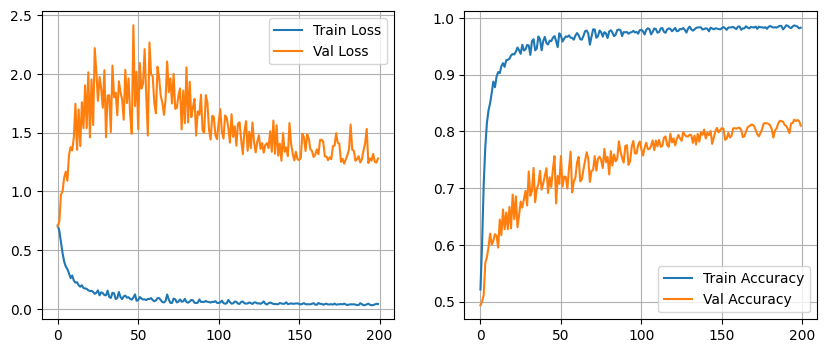

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4));
ax[0].plot(model.history.history['loss'], label="Train Loss");
ax[0].plot(model.history.history['val_loss'], label='Val Loss');
ax[0].grid();
ax[0].legend();
ax[1].plot(model.history.history['accuracy'], label="Train Accuracy");
ax[1].plot(model.history.history['val_accuracy'], label='Val Accuracy');
ax[1].grid();
ax[1].legend();

In [ ]:
##save the model 
model.save_weights("./gdrive/MyDrive/am220/MobileNet.h5")

In [17]:
model.load_weights("./gdrive/MyDrive/am220/MobileNet.h5")

In [28]:
for X, y in train_dataset.take(1):
  pass

In [30]:
prediction = model(X)

In [ ]:
print("Train accuracy:")
avg_accuracy(model, train_dataset)

Train accuracy:


0.8504080724234533

In [20]:
print("Test Accuracy:")
avg_accuracy(model, test_dataset)

Test Accuracy:


0.8100876471008917

In [21]:
print("Train IOU: ")
avg_IoU(model, train_dataset)

Train IOU: 


0.7344691208258843

In [22]:
print("Test IOU: ")
avg_IoU(model, test_dataset)

Test IOU: 


0.681750472784482

In [ ]:
print("Train DICE: ")
avg_DICE(model, train_dataset)

Train DICE: 


0.42329986886627313

In [ ]:
print("Test DICE: ")
avg_DICE(model, test_dataset)

Test DICE: 


0.40518602028090683

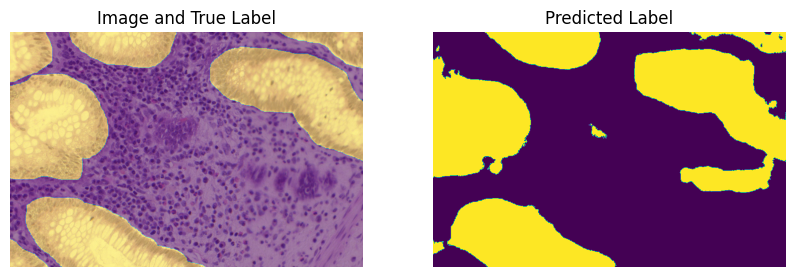

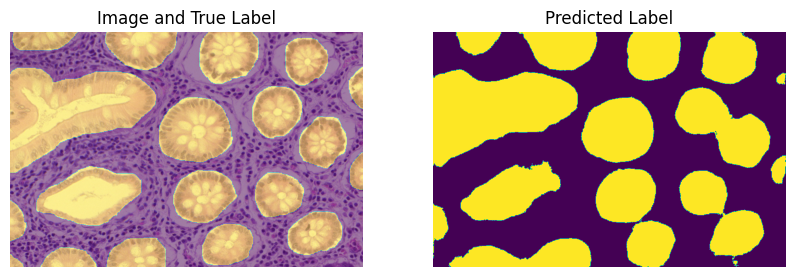

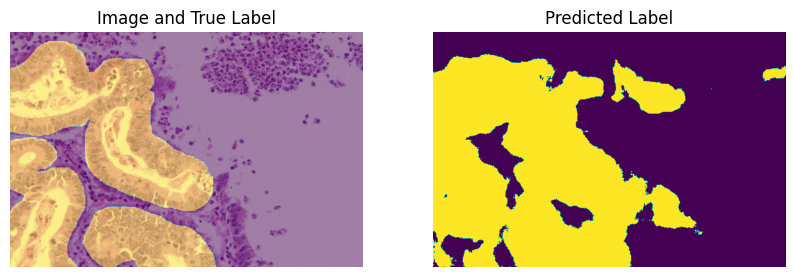

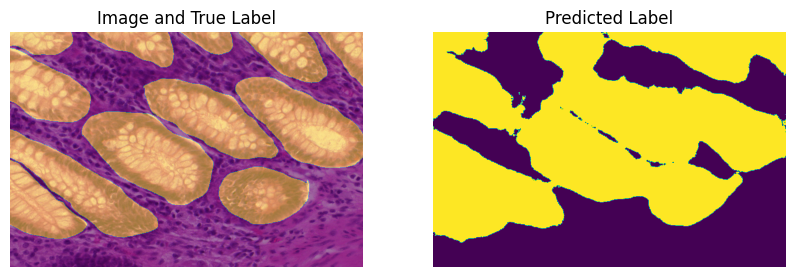

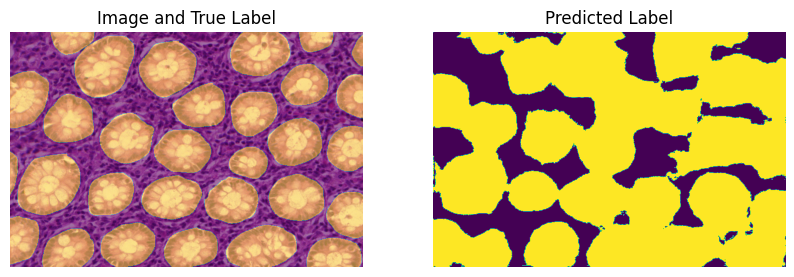

...

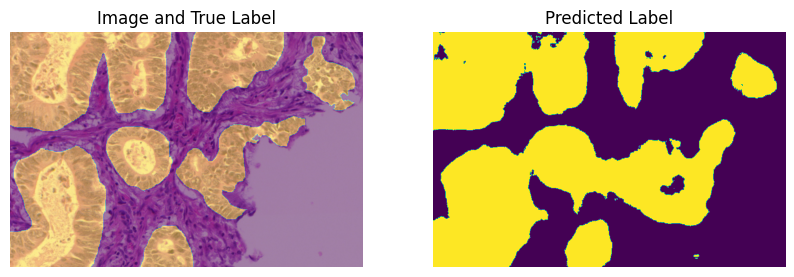

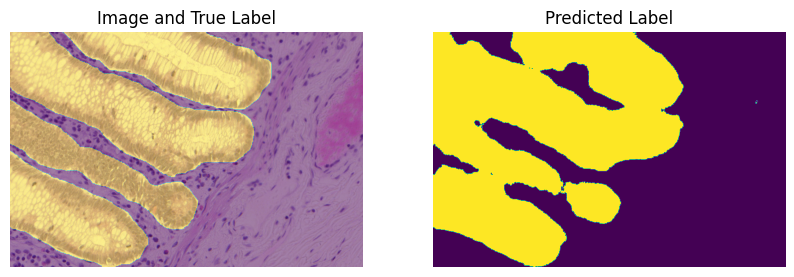

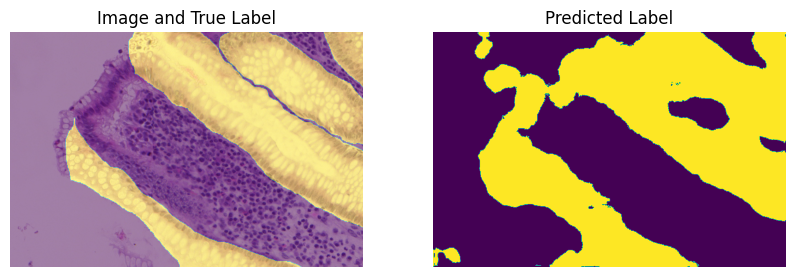

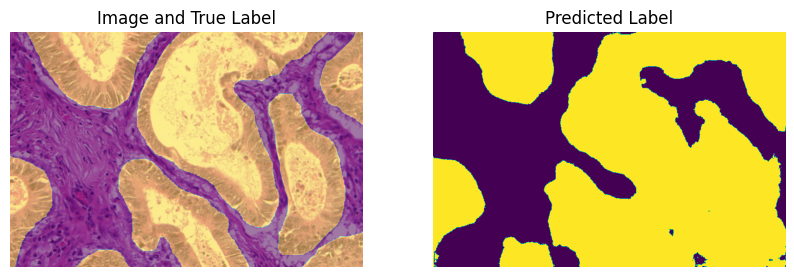

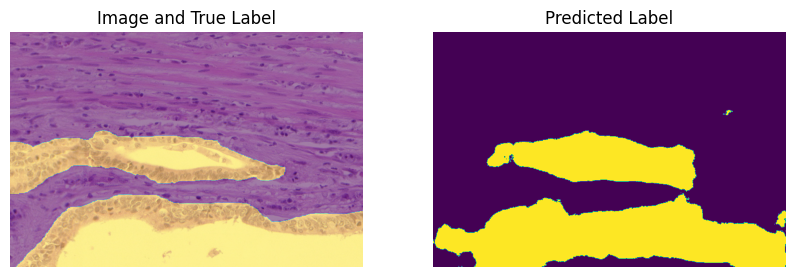

In [31]:
root = "./gdrive/MyDrive/am220/MobileNetResult/train"
for i in range(X.shape[0]):
  save = root + "batch1_{}.png".format(i)
  plot_result(prediction[i], y[i], X[i], save = save)

In [42]:
for testx, testy in test_dataset.take(1):
  pass

In [33]:
prediction_test = model(testx)

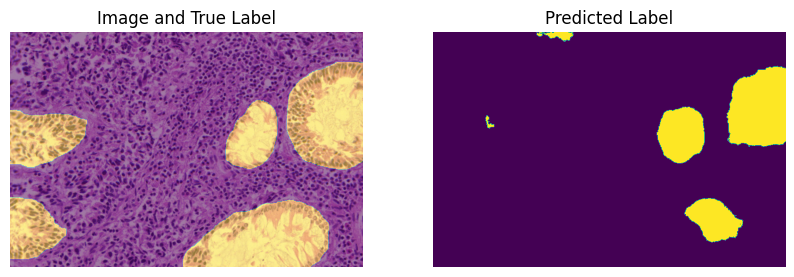

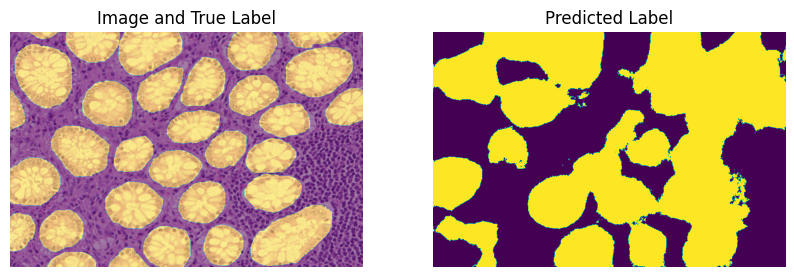

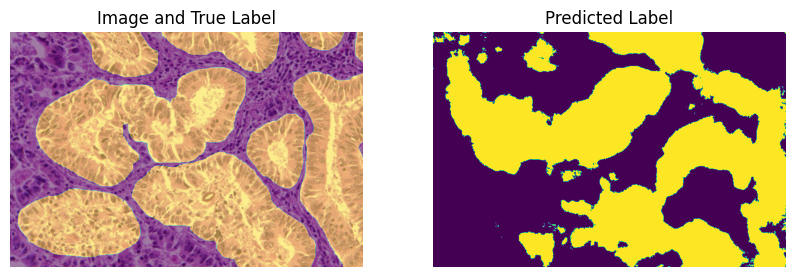

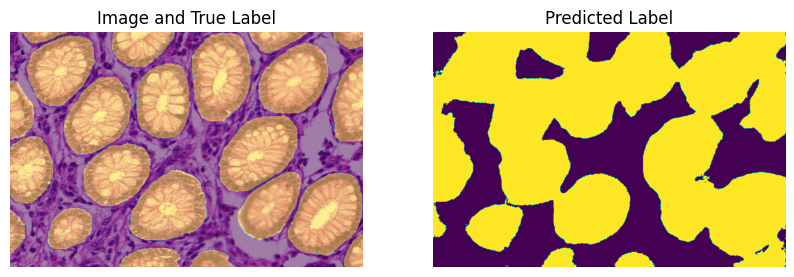

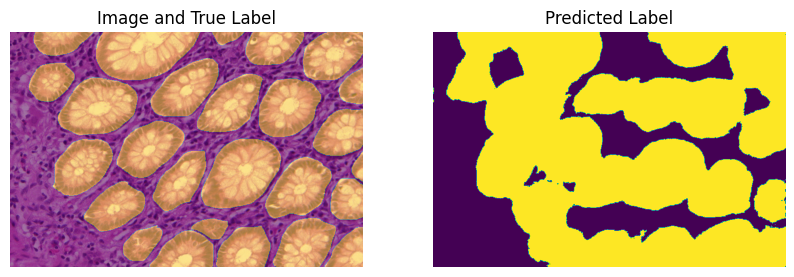

...

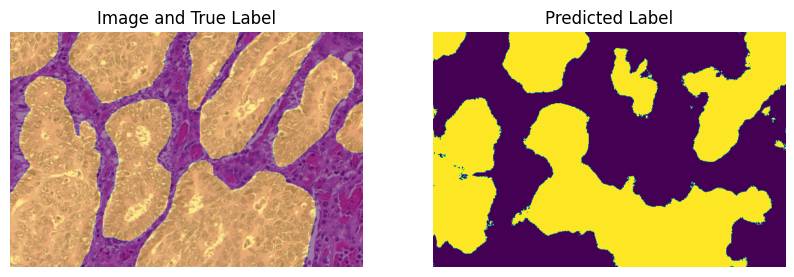

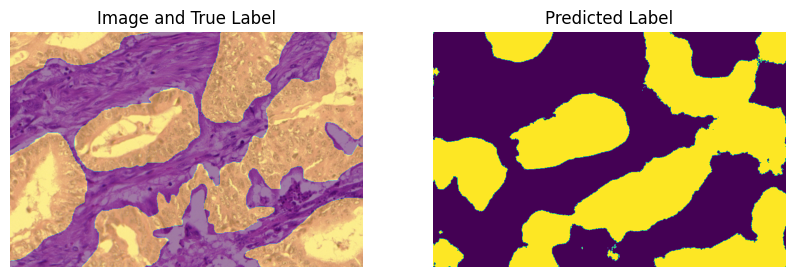

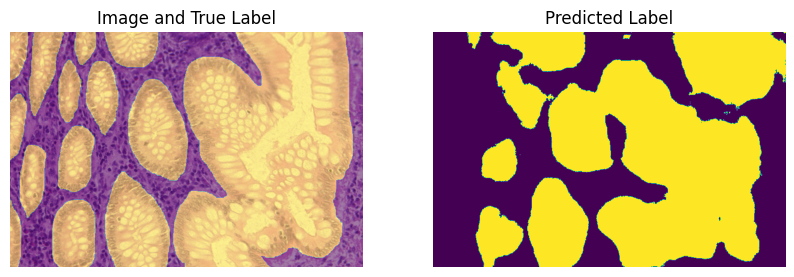

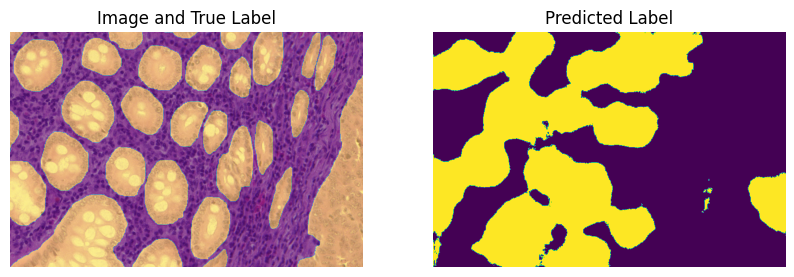

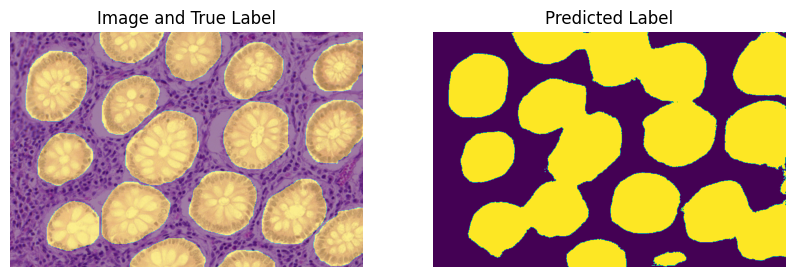

In [34]:
for i in range(testx.shape[0]):
  save = root + "test_batch1_{}.png".format(i)
  plot_result(prediction_test[i], testy[i], testx[i], save = save)

In [4]:
model_scratch = get_model(inputshape=(512, 768, 3), pretrained=False, add_activation=True)
model_scratch.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 768, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 256, 384, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 256, 384, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [34]:
model_scratch.compile(loss="binary_crossentropy",
                  optimizer=tf.optimizers.RMSprop(learning_rate=5e-5),
                  metrics=['accuracy'])

In [35]:
model_scratch.fit(train_dataset, validation_data = test_dataset, epochs=400)

Epoch 1/400
9/9 [==============================] - 23s 363ms/step - loss: 0.6906 - accuracy: 0.5327 - val_loss: 0.6933 - val_accuracy: 0.4556
Epoch 2/400
9/9 [==============================] - 2s 261ms/step - loss: 0.6765 - accuracy: 0.5727 - val_loss: 0.6932 - val_accuracy: 0.4524
Epoch 3/400
9/9 [==============================] - 2s 260ms/step - loss: 0.6599 - accuracy: 0.6032 - val_loss: 0.6933 - val_accuracy: 0.4543
Epoch 4/400
9/9 [==============================] - 2s 258ms/step - loss: 0.6393 - accuracy: 0.6345 - val_loss: 0.6933 - val_accuracy: 0.4541
Epoch 5/400
9/9 [==============================] - 2s 260ms/step - loss: 0.6060 - accuracy: 0.6737 - val_loss: 0.6932 - val_accuracy: 0.4821
Epoch 6/400
9/9 [==============================] - 2s 259ms/step - loss: 0.5709 - accuracy: 0.6998 - val_loss: 0.6932 - val_accuracy: 0.4815
Epoch 7/400
9/9 [==============================] - 2s 260ms/step - loss: 0.4872 - accuracy: 0.7668 - val_loss: 0.6927 - val_accuracy: 0.5356
Epoch 8/400


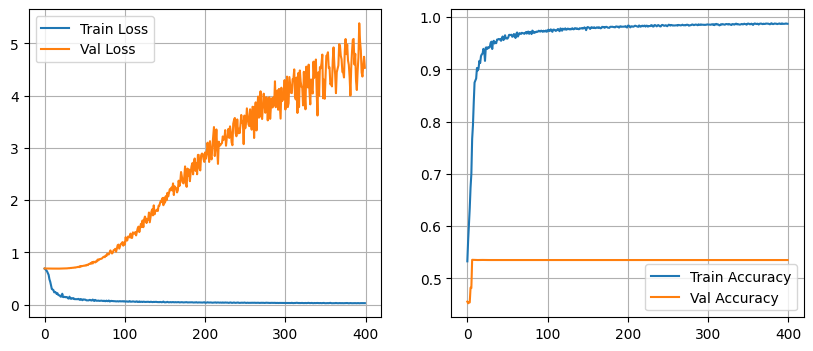

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4));
ax[0].plot(model_scratch.history.history['loss'], label="Train Loss");
ax[0].plot(model_scratch.history.history['val_loss'], label='Val Loss');
ax[0].grid();
ax[0].legend();
ax[1].plot(model_scratch.history.history['accuracy'], label="Train Accuracy");
ax[1].plot(model_scratch.history.history['val_accuracy'], label='Val Accuracy');
ax[1].grid();
ax[1].legend();

In [37]:
print("Train accuracy:")
avg_accuracy(model_scratch, train_dataset)

Train accuracy:


0.5045468108822602

In [38]:
print("Test Accuracy:")
avg_accuracy(model_scratch, test_dataset)

Test Accuracy:


0.5351899272263653

In [39]:
print("Train IOU: ")
avg_IoU(model_scratch, train_dataset)

Train IOU: 


0.5045468108822602

In [40]:
print("Test IOU: ")
avg_IoU(model_scratch, test_dataset)

Test IOU: 


0.5351899272263653

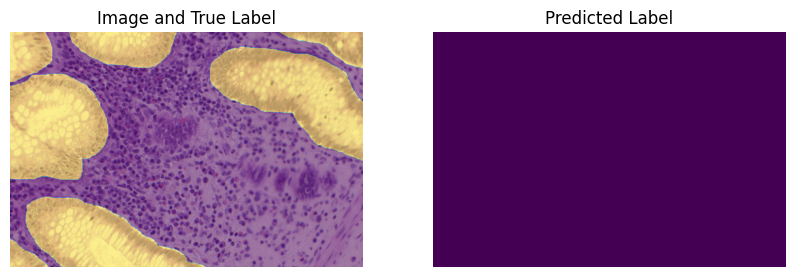

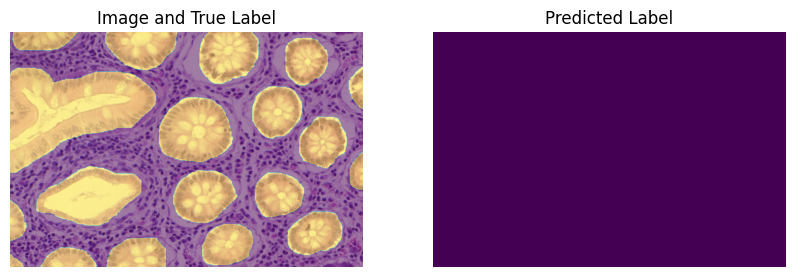

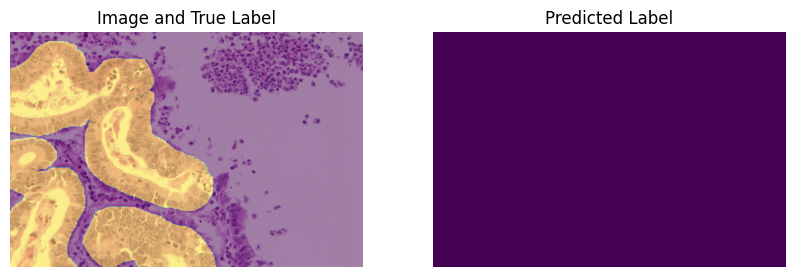

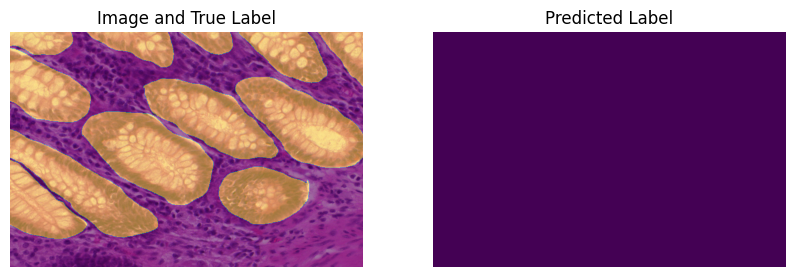

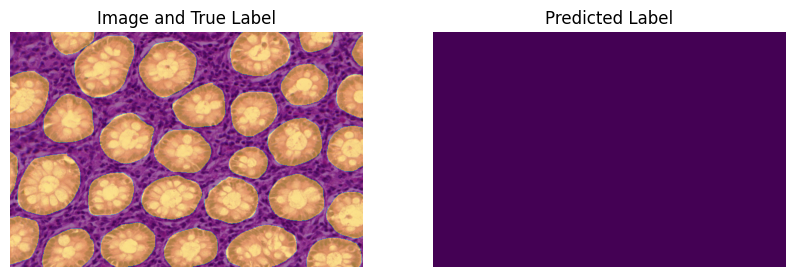

...

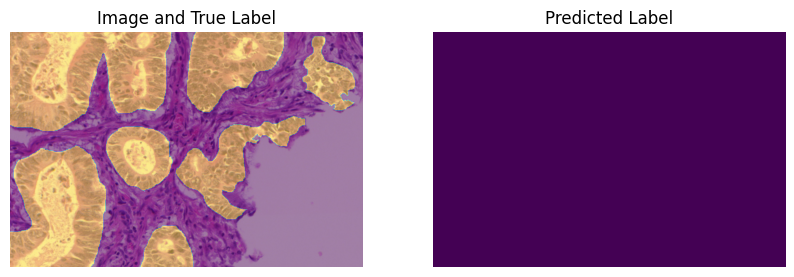

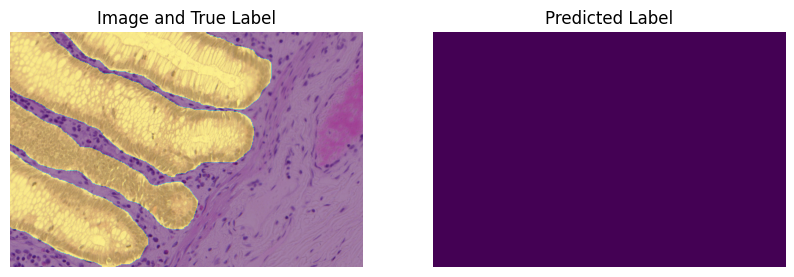

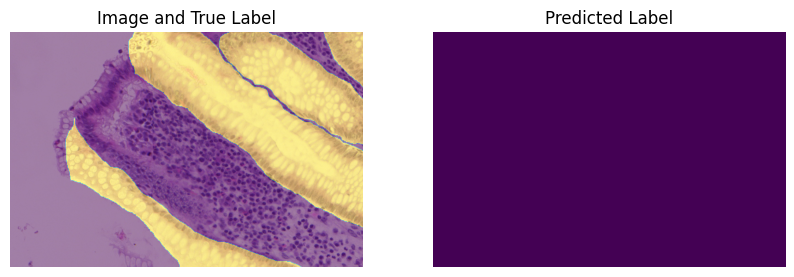

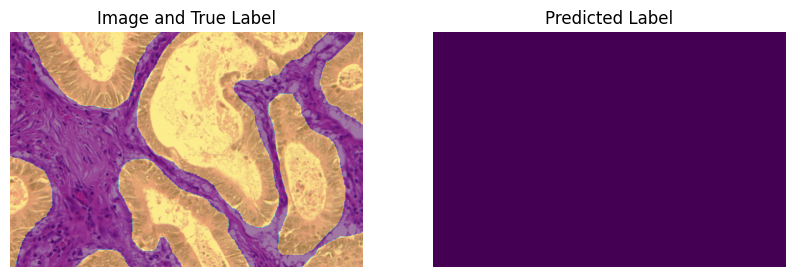

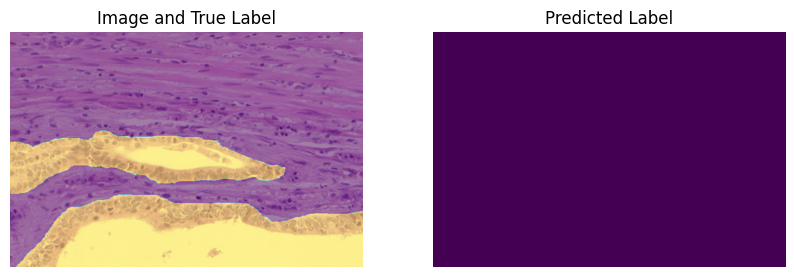

In [41]:
prediction_scratch = model_scratch(X)
#root = "./gdrive/MyDrive/am220/MobileNetResult/train"
for i in range(X.shape[0]):
  #save = root + "batch1_{}.png".format(i)
  plot_result(prediction_scratch[i], y[i], X[i])

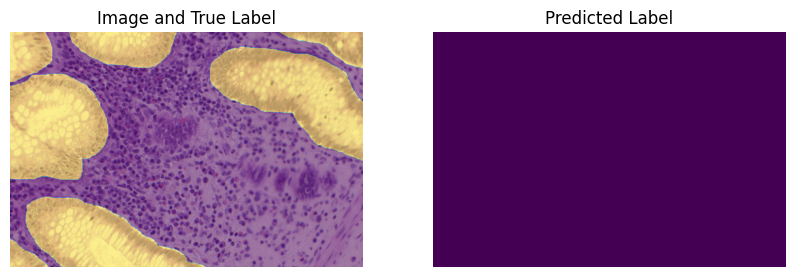

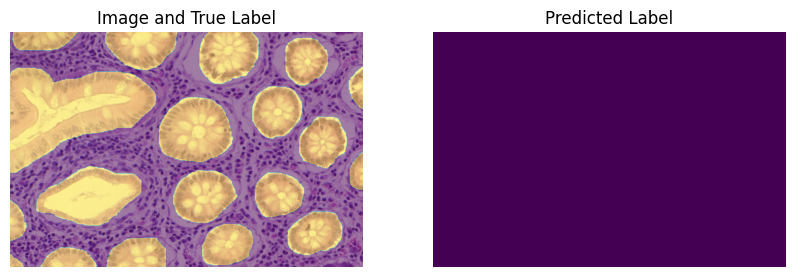

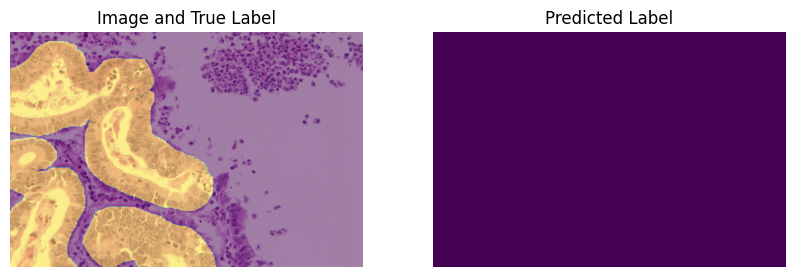

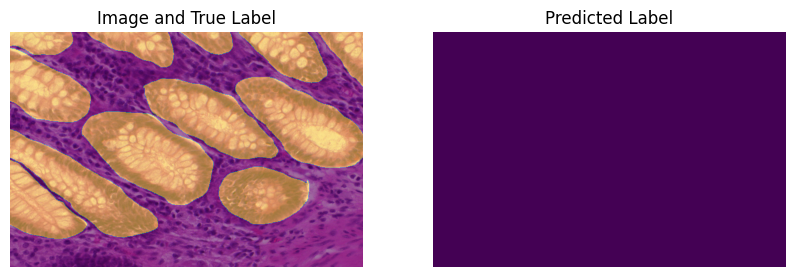

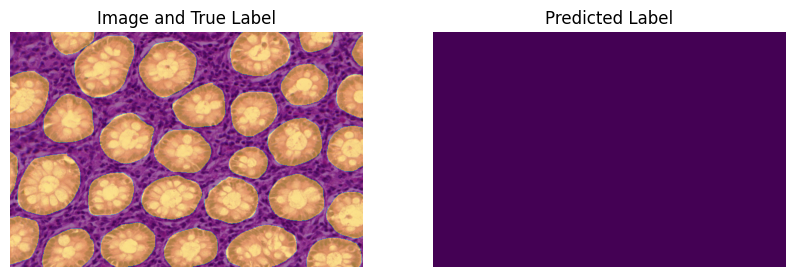

...

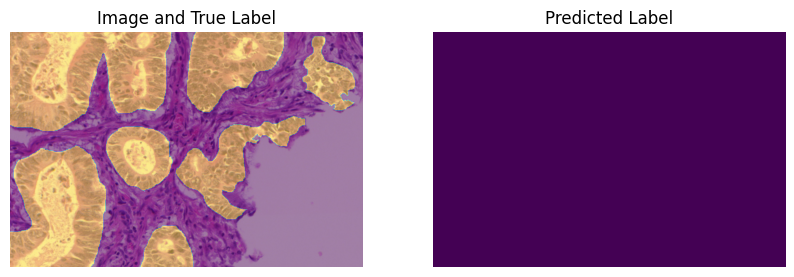

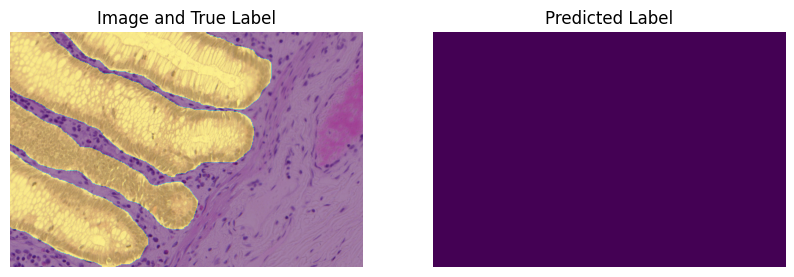

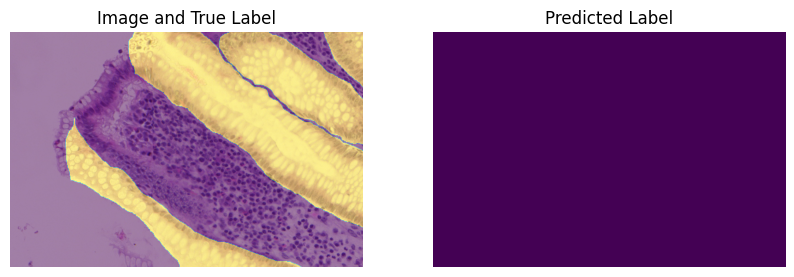

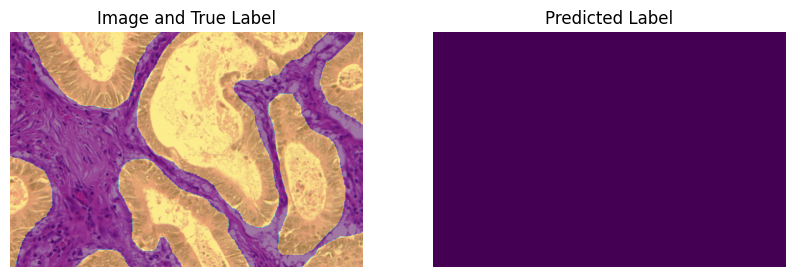

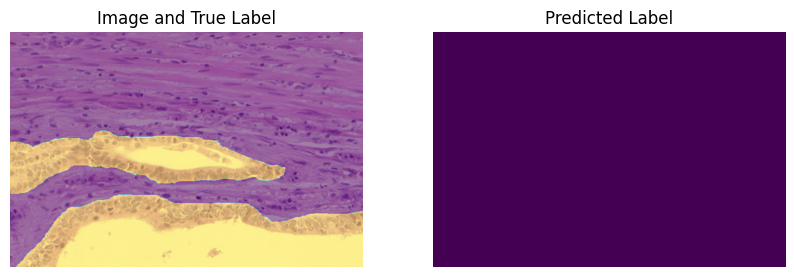

In [43]:
prediction_scratch_test = model_scratch(testx)
#root = "./gdrive/MyDrive/am220/MobileNetResult/train"
for i in range(testx.shape[0]):
  #save = root + "batch1_{}.png".format(i)
  plot_result(prediction_scratch_test[i], y[i], X[i])

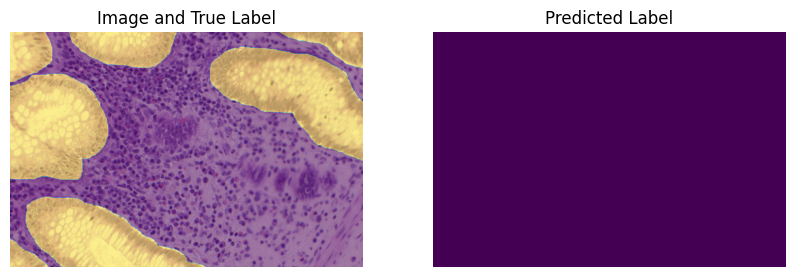

In [47]:
plot_result(prediction_scratch[0], y[0], X[0])

In [48]:
def plot_result(pred, y, X, save=None, show_label=True):
  pred = (pred.numpy() > 0.5)*1
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(X, zorder=0)
  if show_label:
    ax[0].imshow(y, alpha=.5)
  ax[0].axis('off')
  ax[0].set_title("Image and True Label");
  ax[1].imshow(pred)
  ax[1].axis('off')
  ax[1].set_title("Predicted Label");
  if save is not None:
    plt.savefig(save, dpi=200)

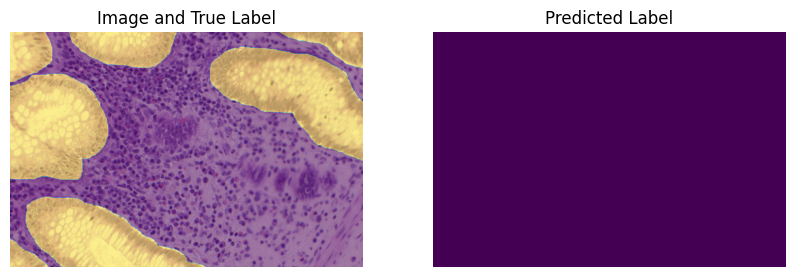

In [49]:
pred = (prediction_scratch[0].numpy() > 0.5)*1
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(X[0], zorder=0)
ax[0].imshow(y[0], alpha=.5)
ax[0].axis('off')
ax[0].set_title("Image and True Label");
ax[1].imshow(pred)
ax[1].axis('off')
ax[1].set_title("Predicted Label");